In [1]:
import pandas as pd
import numpy as np
import sklearn
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

In [2]:
data =pd.read_csv(r'E:\MLBS\B1\heart_disease_prediction\framingham.csv')

In [3]:
print("First 5 rows of the dataset:")
# print(data.head())
data.head()

First 5 rows of the dataset:


,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0


In [4]:
print("\nDataset Information:")
data.info()


Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4240 entries, 0 to 4239
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   male             4240 non-null   int64  
 1   age              4240 non-null   int64  
 2   education        4135 non-null   float64
 3   currentSmoker    4240 non-null   int64  
 4   cigsPerDay       4211 non-null   float64
 5   BPMeds           4187 non-null   float64
 6   prevalentStroke  4240 non-null   int64  
 7   prevalentHyp     4240 non-null   int64  
 8   diabetes         4240 non-null   int64  
 9   totChol          4190 non-null   float64
 10  sysBP            4240 non-null   float64
 11  diaBP            4240 non-null   float64
 12  BMI              4221 non-null   float64
 13  heartRate        4239 non-null   float64
 14  glucose          3852 non-null   float64
 15  TenYearCHD       4240 non-null   int64  
dtypes: float64(9), int64(7)
memory usage: 

In [5]:
summary_stats = data.describe()

In [6]:
print("\nSummary Statistics:")
summary_stats


Summary Statistics:


,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
count,4240.000000,4240.000000,4135.000000,4240.000000,4211.000000,4187.000000,4240.000000,4240.000000,4240.000000,4190.000000,4240.000000,4240.000000,4221.000000,4239.000000,3852.000000,4240.000000
mean,0.429245,49.580189,1.979444,0.494104,9.005937,0.029615,0.005896,0.310613,0.025708,236.699523,132.354599,82.897759,25.800801,75.878981,81.963655,0.151887
std,0.495027,8.572942,1.019791,0.500024,11.922462,0.169544,0.076569,0.462799,0.158280,44.591284,22.033300,11.910394,4.079840,12.025348,23.954335,0.358953
min,0.000000,32.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,107.000000,83.500000,48.000000,15.540000,44.000000,40.000000,0.000000
25%,0.000000,42.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,206.000000,117.000000,75.000000,23.070000,68.000000,71.000000,0.000000
50%,0.000000,49.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,234.000000,128.000000,82.000000,25.400000,75.000000,78.000000,0.000000
75%,1.000000,56.000000,3.000000,1.000000,20.000000,0.000000,0.000000,1.000000,0.000000,263.000000,144.000000,90.000000,28.040000,83.000000,87.000000,0.000000
max,1.000000,70.000000,4.000000,1.000000,70.000000,1.000000,1.000000,1.000000,1.000000,696.000000,295.000000,142.500000,56.800000,143.000000,394.000000,1.000000


In [7]:
print("Missing values in each column:")
print(data.isnull().sum())

Missing values in each column:
male                 0
age                  0
education          105
currentSmoker        0
cigsPerDay          29
BPMeds              53
prevalentStroke      0
prevalentHyp         0
diabetes             0
totChol             50
sysBP                0
diaBP                0
BMI                 19
heartRate            1
glucose            388
TenYearCHD           0
dtype: int64


In [8]:
data.isnull().values.any()

True

In [9]:
data_cleaned = data.dropna()

In [10]:
data_cleaned

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4233,1,50,1.0,1,1.0,0.0,0,1,0,313.0,179.0,92.0,25.97,66.0,86.0,1
4234,1,51,3.0,1,43.0,0.0,0,0,0,207.0,126.5,80.0,19.71,65.0,68.0,0
4237,0,52,2.0,0,0.0,0.0,0,0,0,269.0,133.5,83.0,21.47,80.0,107.0,0
4238,1,40,3.0,0,0.0,0.0,0,1,0,185.0,141.0,98.0,25.60,67.0,72.0,0


In [11]:
data.isnull().values.any()

True

In [12]:
data['education'].fillna(data['education'].mean(),inplace=True)
data['cigsPerDay'].fillna(data['cigsPerDay'].mean(),inplace=True)
data['BPMeds'].fillna(data['BPMeds'].mean(),inplace=True)
data['totChol'].fillna(data['totChol'].mean(),inplace=True)
data['BMI'].fillna(data['BMI'].mean(),inplace=True)
data['education'].fillna(data['education'].mean(),inplace=True)
data['glucose'].fillna(data['glucose'].mean(),inplace=True)
data['heartRate'].fillna(data['heartRate'].mean(),inplace=True)


In [13]:
data.isnull().values.any()

False

In [14]:
missing_values_cleaned = data_cleaned.isnull().sum()

In [15]:
missing_values_cleaned

male               0
age                0
education          0
currentSmoker      0
cigsPerDay         0
BPMeds             0
prevalentStroke    0
prevalentHyp       0
diabetes           0
totChol            0
sysBP              0
diaBP              0
BMI                0
heartRate          0
glucose            0
TenYearCHD         0
dtype: int64

In [16]:
data.isnull().values.any()

False

In [17]:
data.isna().any()

male               False
age                False
education          False
currentSmoker      False
cigsPerDay         False
BPMeds             False
prevalentStroke    False
prevalentHyp       False
diabetes           False
totChol            False
sysBP              False
diaBP              False
BMI                False
heartRate          False
glucose            False
TenYearCHD         False
dtype: bool

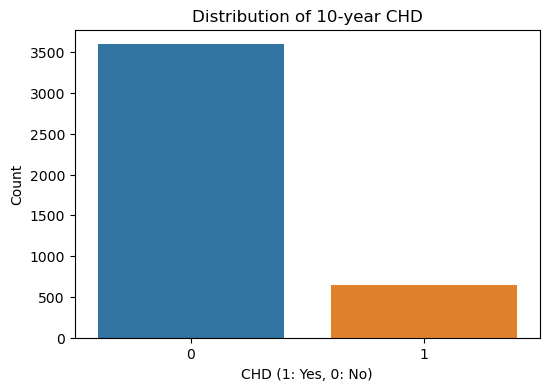

In [18]:
plt.figure(figsize=(6, 4))
sns.countplot(x='TenYearCHD', data=data)
plt.title('Distribution of 10-year CHD')
plt.xlabel('CHD (1: Yes, 0: No)')
plt.ylabel('Count')
plt.show()

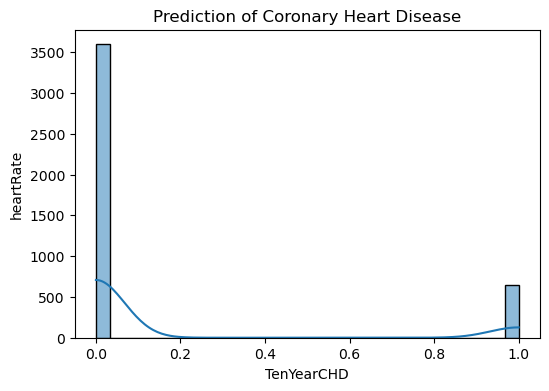

In [19]:
plt.figure(figsize=(6, 4))
sns.histplot(data['TenYearCHD'], bins=30, kde=True)
plt.xlabel('TenYearCHD')
plt.ylabel('heartRate')
plt.title('Prediction of Coronary Heart Disease')
plt.show() 

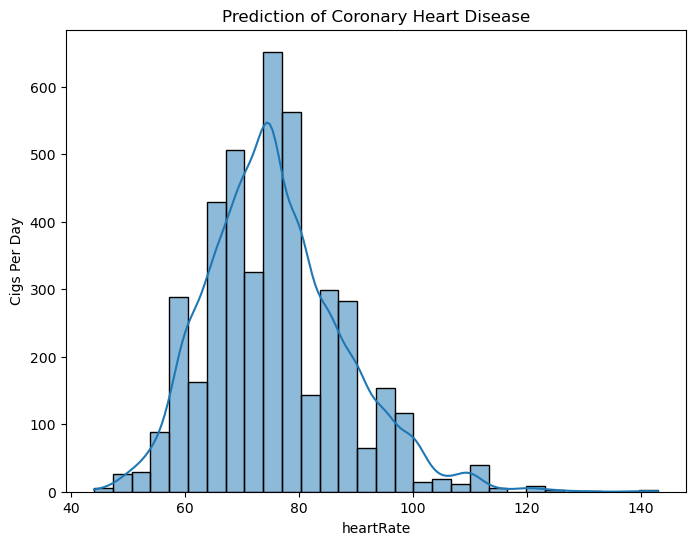

In [20]:
plt.figure(figsize=(8, 6))
sns.histplot(data['heartRate'], bins=30, kde=True)
plt.xlabel('heartRate')
plt.ylabel('Cigs Per Day')
plt.title('Prediction of Coronary Heart Disease')
plt.show()

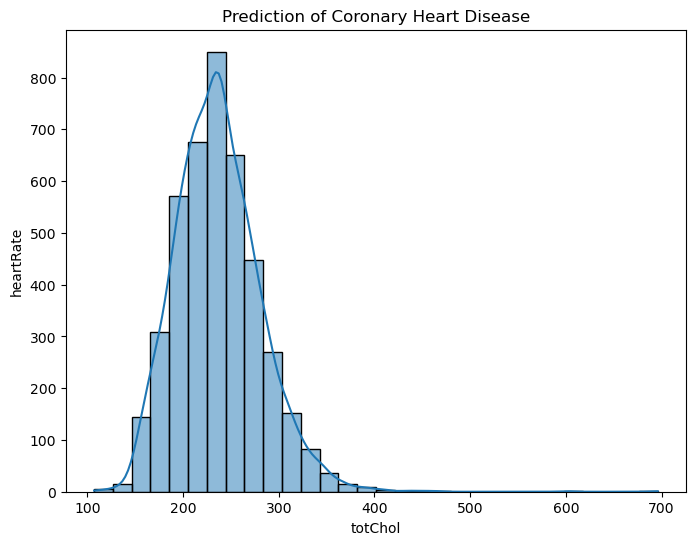

In [21]:
plt.figure(figsize=(8, 6))
sns.histplot(data['totChol'], bins=30, kde=True)
plt.xlabel('totChol')
plt.ylabel('heartRate')
plt.title('Prediction of Coronary Heart Disease')
plt.show()

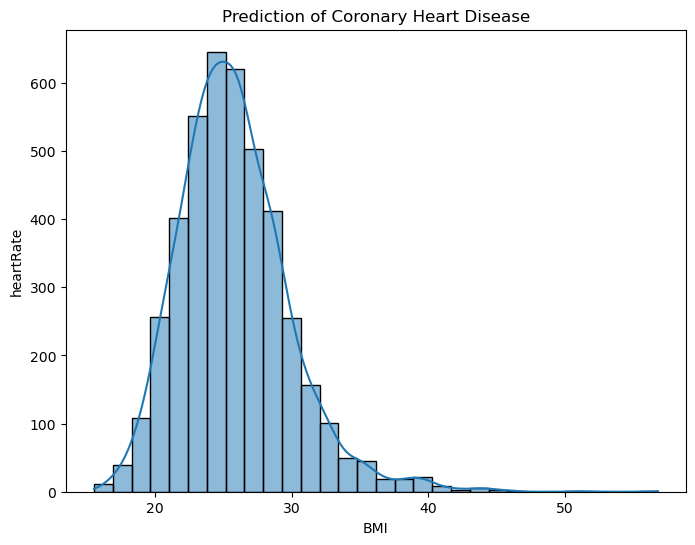

In [22]:
plt.figure(figsize=(8, 6))
sns.histplot(data['BMI'], bins=30, kde=True)
plt.xlabel('BMI')
plt.ylabel('heartRate')
plt.title('Prediction of Coronary Heart Disease')
plt.show() 

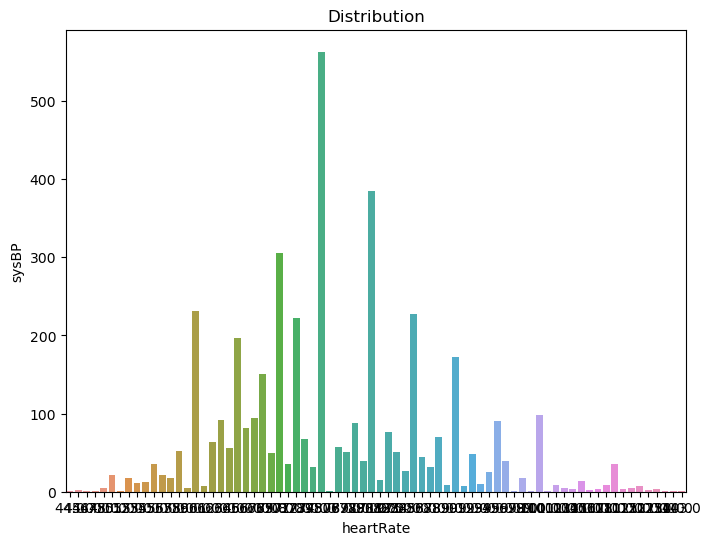

In [23]:
plt.figure(figsize=(8, 6))
sns.countplot(x='heartRate', data=data)
plt.xlabel('heartRate')
plt.ylabel('sysBP')
plt.title('Distribution')
plt.show()

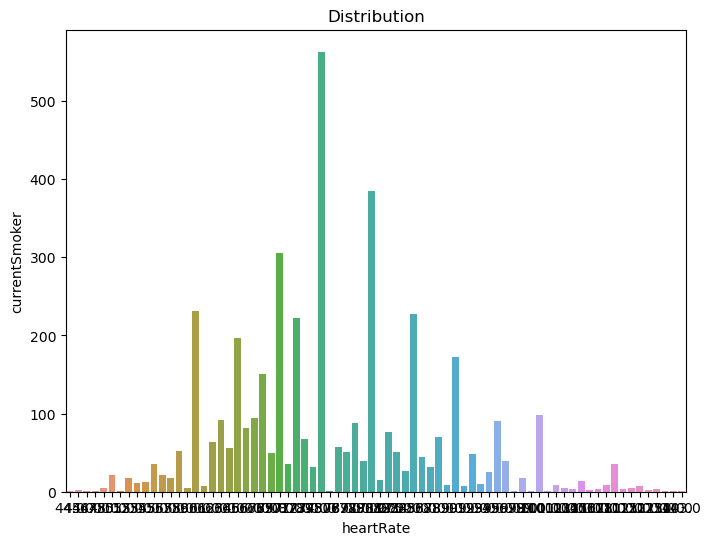

In [24]:
plt.figure(figsize=(8, 6))
sns.countplot(x='heartRate', data=data)
plt.xlabel('heartRate')
plt.ylabel('currentSmoker')
plt.title('Distribution')
plt.show()

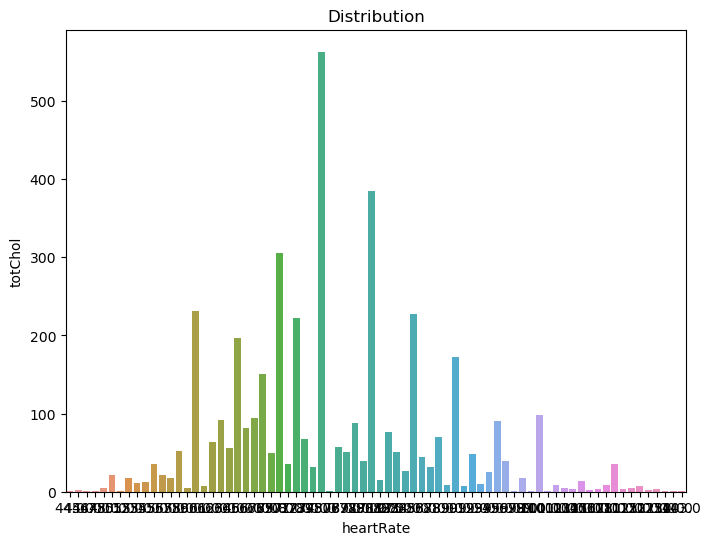

In [25]:
plt.figure(figsize=(8, 6))
sns.countplot(x='heartRate', data=data)
plt.xlabel('heartRate')
plt.ylabel('totChol')
plt.title('Distribution')
plt.show()

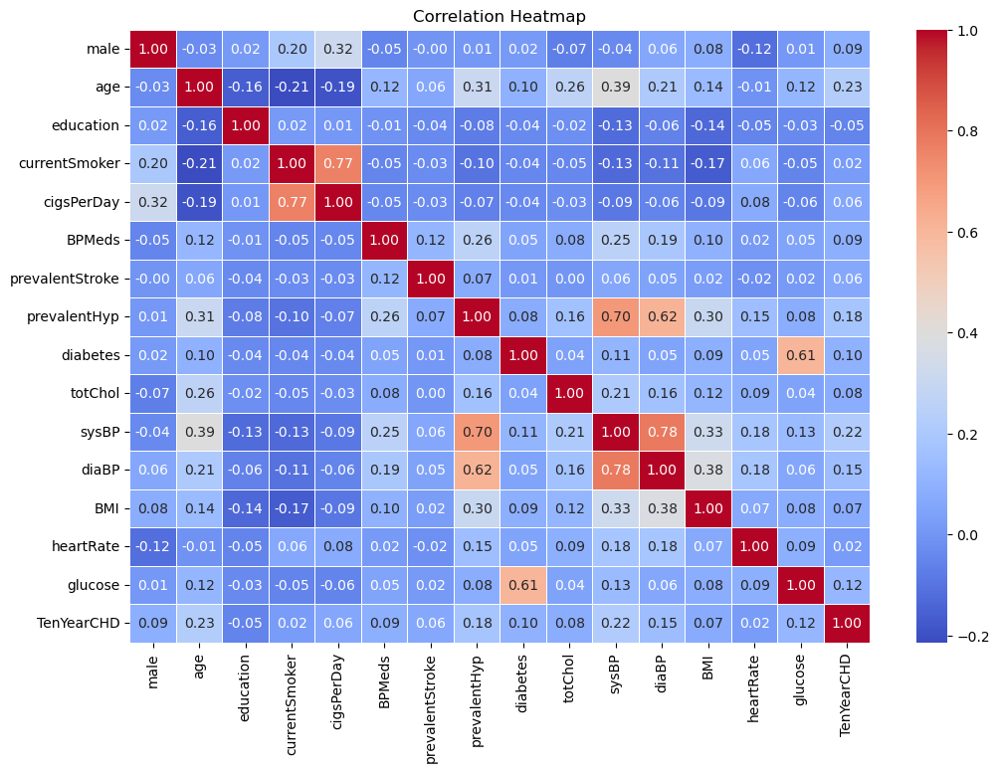

In [26]:
correlation_matrix = data.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [27]:
selected_features = data[['male', 'age', 'education', 'currentSmoker', 'cigsPerDay', 'BPMeds', 'prevalentHyp', 'diabetes', 'totChol', 'sysBP', 'diaBP', 'BMI', 'heartRate', 'glucose']]

In [28]:
correlation_matrix = selected_features.corr()

In [29]:
correlation_age_totChol = correlation_matrix.loc['age', 'totChol']

print(f"Correlation between 'age' and 'totChol': {correlation_age_totChol:.2f}")

Correlation between 'age' and 'totChol': 0.26


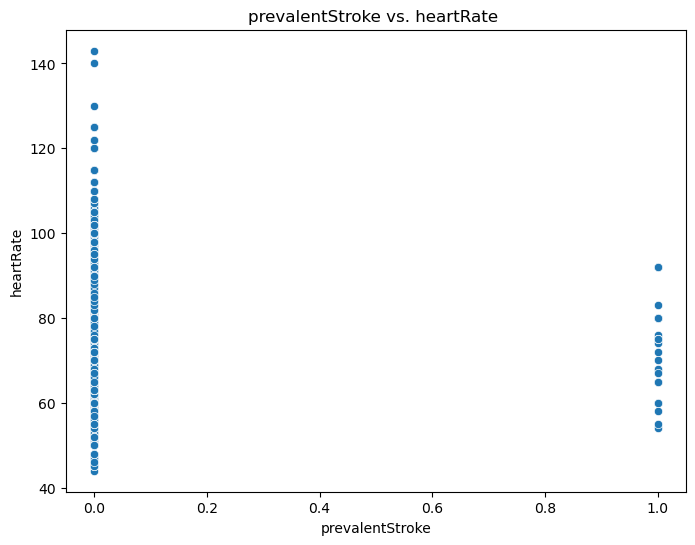

In [30]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='prevalentStroke', y='heartRate', data=data)
plt.xlabel('prevalentStroke')
plt.ylabel('heartRate')
plt.title('prevalentStroke vs. heartRate ')
plt.show()

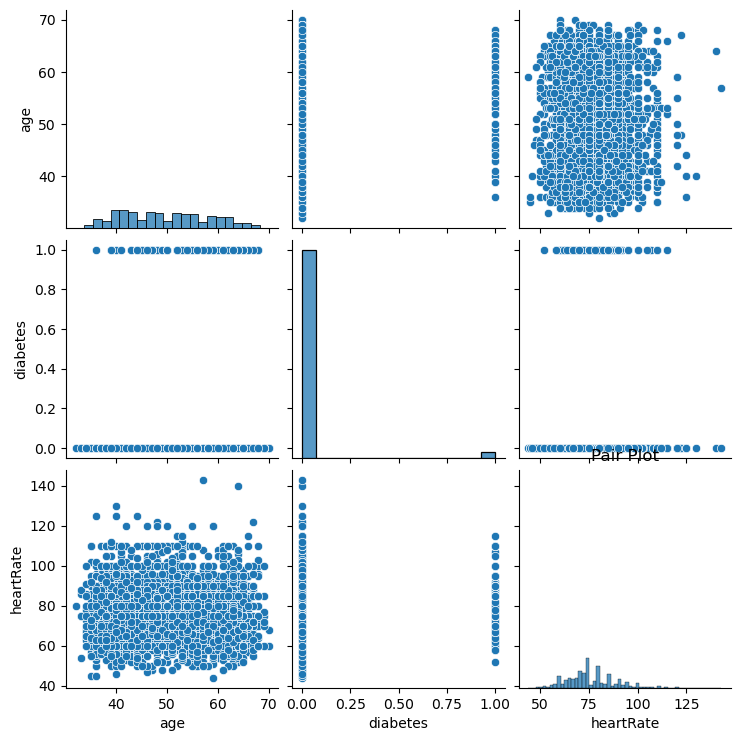

In [33]:
sns.pairplot(data[['age', 'diabetes', 'heartRate']])
plt.title('Pair Plot')
plt.show()

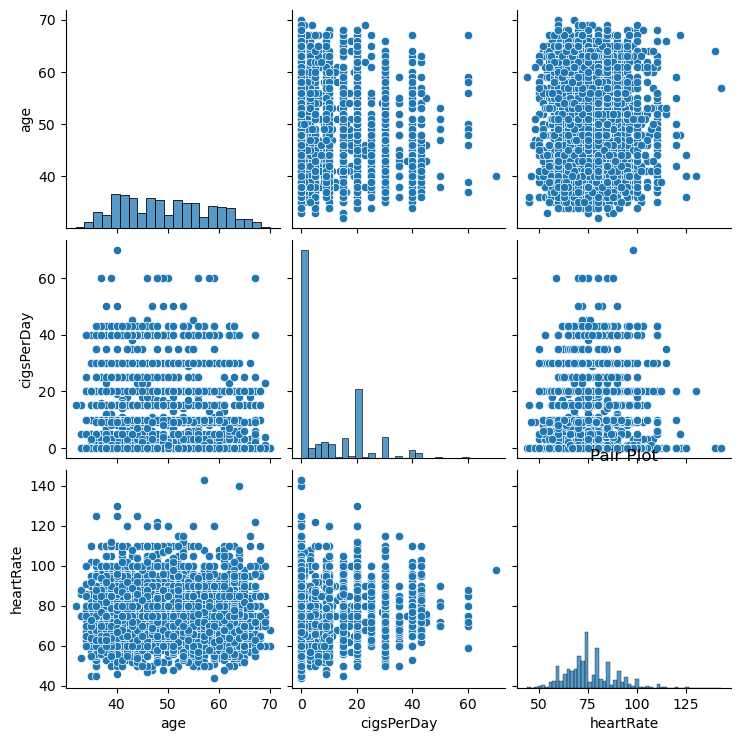

In [34]:
sns.pairplot(data[['age', 'cigsPerDay', 'heartRate']])
plt.title('Pair Plot')
plt.show()

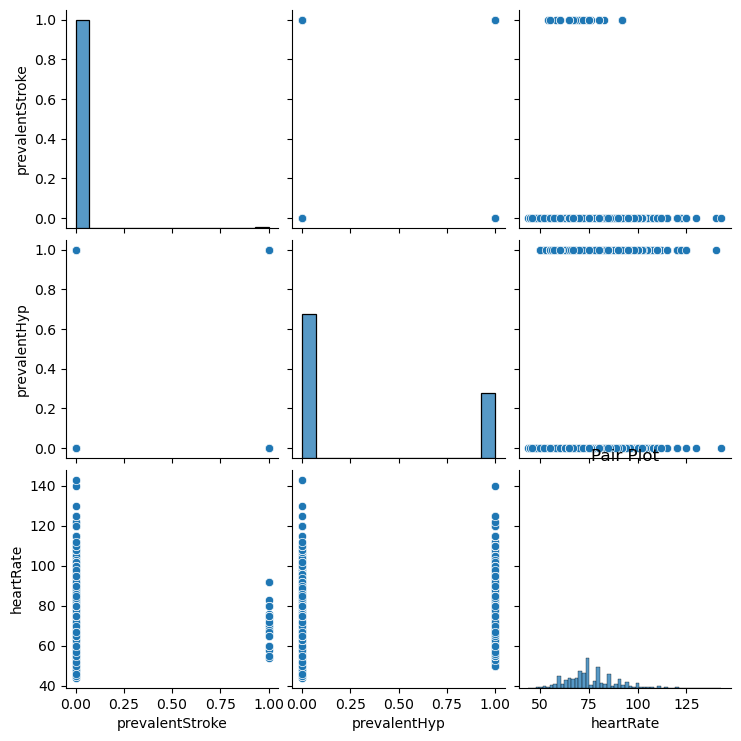

In [35]:
sns.pairplot(data[['prevalentStroke', 'prevalentHyp', 'heartRate']])
plt.title('Pair Plot')
plt.show()

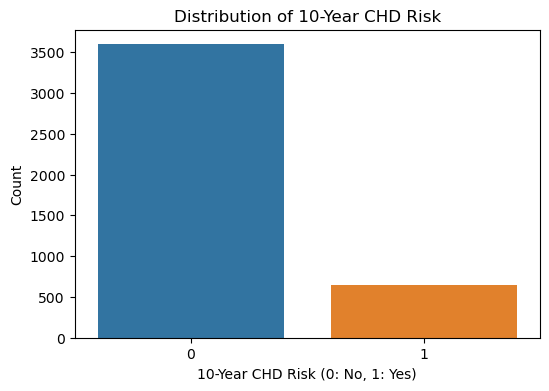

In [36]:
plt.figure(figsize=(6, 4))
sns.countplot(x='TenYearCHD', data=data)
plt.xlabel('10-Year CHD Risk (0: No, 1: Yes)')
plt.ylabel('Count')# refers to the count of occurrences of each unique value in the 'TenYearCHD' column  
plt.title('Distribution of 10-Year CHD Risk')
plt.show()

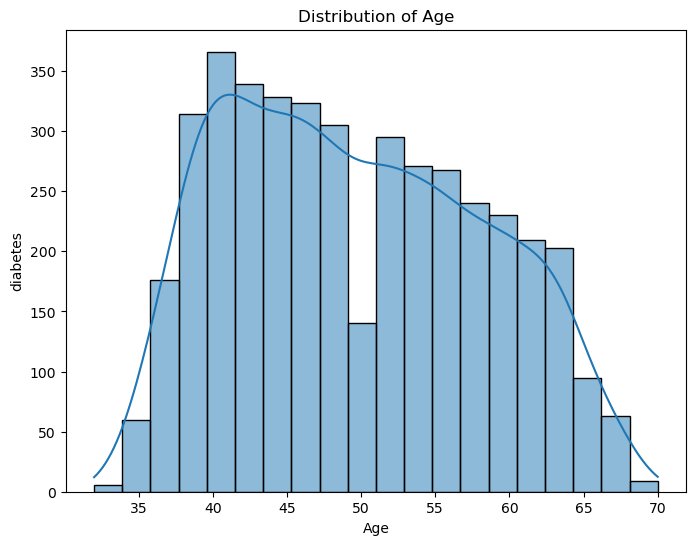

In [37]:
plt.figure(figsize=(8, 6))
sns.histplot(data['age'], bins=20, kde=True)
plt.xlabel('Age')
plt.ylabel('diabetes')
plt.title('Distribution of Age')
plt.show()

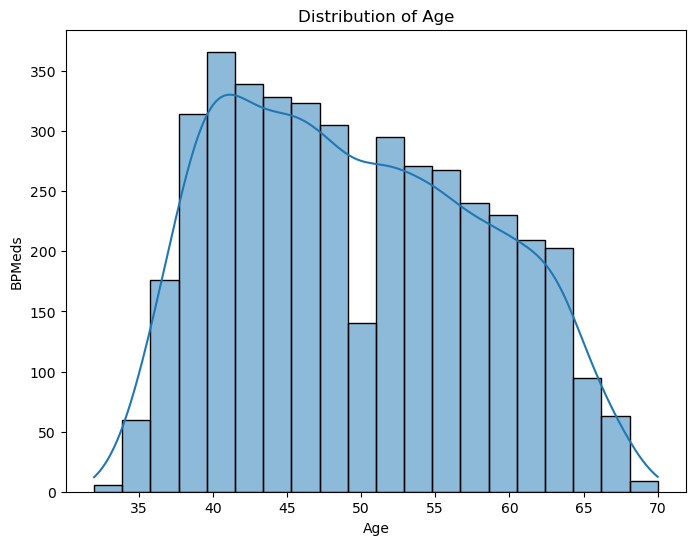

In [38]:
plt.figure(figsize=(8, 6))
sns.histplot(data['age'], bins=20, kde=True)
plt.xlabel('Age')
plt.ylabel('BPMeds')
plt.title('Distribution of Age')
plt.show()

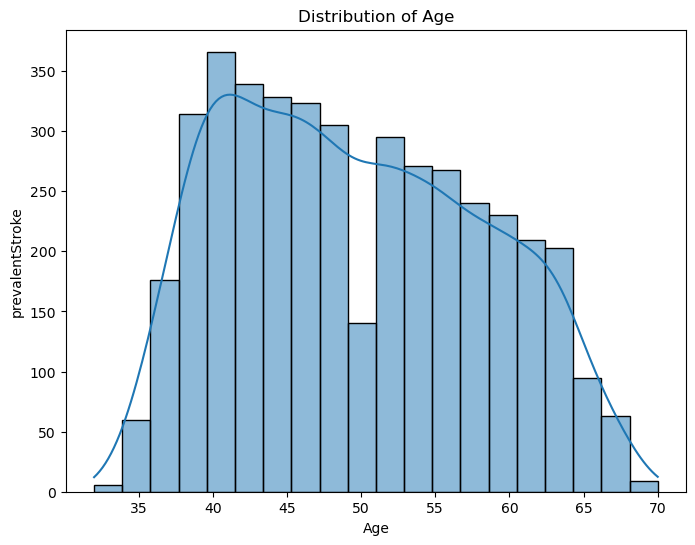

In [39]:
plt.figure(figsize=(8, 6))
sns.histplot(data['age'], bins=20, kde=True)
plt.xlabel('Age')
plt.ylabel('prevalentStroke')
plt.title('Distribution of Age')
plt.show()

In [40]:
z_scores = stats.zscore(data['age'])
threshold = 3
outliers = data[abs(z_scores) > threshold]

In [41]:
z_scores

0      -1.234283
1      -0.417664
2      -0.184345
3       1.332233
4      -0.417664
          ...   
4235   -0.184345
4236   -0.650984
4237    0.282295
4238   -1.117623
4239   -1.234283
Name: age, Length: 4240, dtype: float64

In [42]:
# data['age_group'] = pd.cut(data['age'], bins=[0, 30, 50, 100], labels=['young', 'middle-aged', 'elderly'])

In [43]:
data['age_group'] = pd.cut(data['age'], bins=[0, 30, 50, 100], labels=['0', '1', '2'])

In [44]:
# data['bmi_category'] = pd.cut(data['BMI'], bins=[0, 18.5, 24.9, 29.9, float('inf')],
#                                labels=['underweight', 'normal weight', 'overweight', 'obese'])

In [45]:
data['bmi_category'] = pd.cut(data['BMI'], bins=[0, 18.5, 24.9, 29.9, float('inf')],
                               labels=['0', '1', '2', '3'])

In [46]:
data['sysBP_category'] = pd.cut(data['sysBP'], bins=[0, 120, 139, float('inf')],
                                labels=['0', '1', '2'])

In [47]:
data['age_cigsPerDay_interaction'] = data['age'] * data['cigsPerDay']

In [48]:
print(data['age'].dtype)
print(data['cigsPerDay'].dtype)

int64
float64


In [49]:
data['age'] = data['age'].astype(float)

In [50]:
data['cigsPerDay'] = data['cigsPerDay'].astype(float)

In [51]:
print(data['age'].dtype)
print(data['cigsPerDay'].dtype)

float64
float64


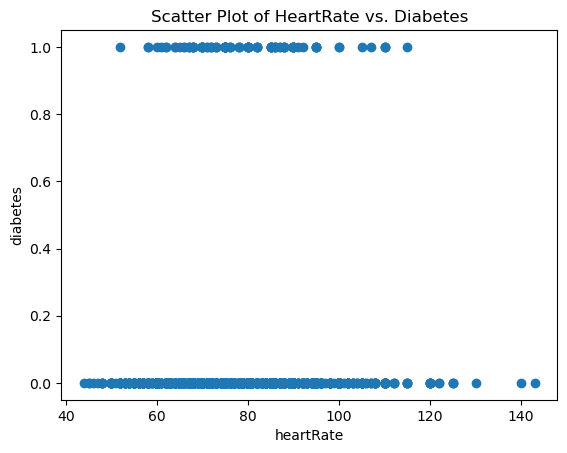

In [52]:
plt.scatter(data['heartRate'], data['diabetes'])
plt.xlabel('heartRate')
plt.ylabel('diabetes')
plt.title('Scatter Plot of HeartRate vs. Diabetes')
plt.show()

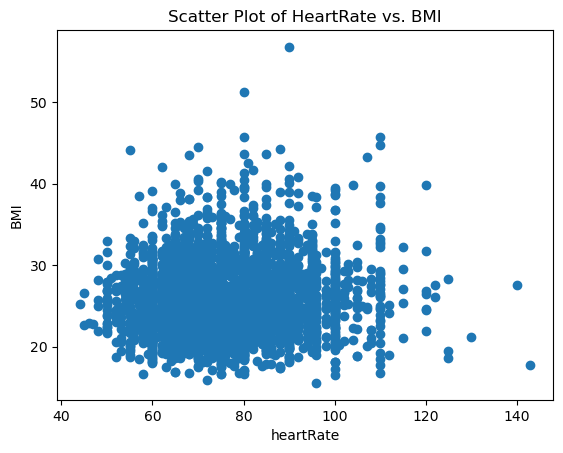

In [57]:
plt.scatter(data['heartRate'], data['BMI'])
plt.xlabel('heartRate')
plt.ylabel('BMI')
plt.title('Scatter Plot of HeartRate vs. BMI')
plt.show()

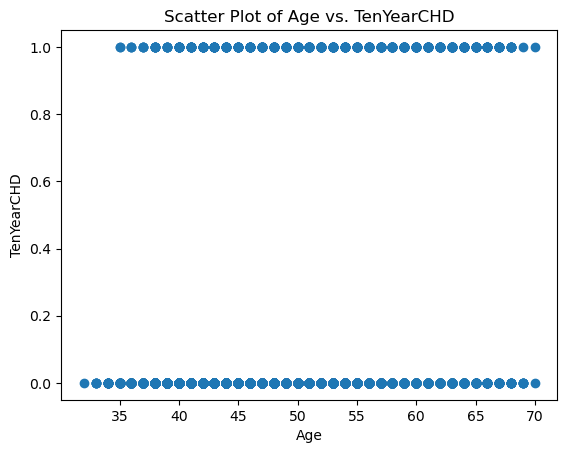

In [58]:
plt.scatter(data['age'], data['TenYearCHD'])
plt.xlabel('Age')
plt.ylabel('TenYearCHD')
plt.title('Scatter Plot of Age vs. TenYearCHD')
plt.show()

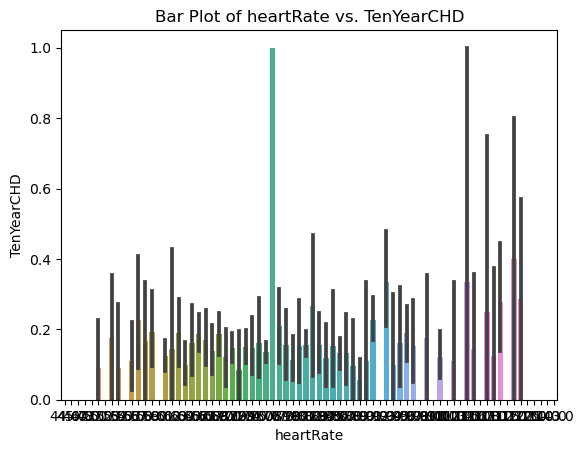

In [59]:
sns.barplot(x='heartRate', y='TenYearCHD', data=data)
plt.xlabel('heartRate')
plt.ylabel('TenYearCHD')
plt.title('Bar Plot of heartRate vs. TenYearCHD')
plt.show()

In [60]:
print(data['age'].dtype)
print(data['male'].dtype)
print(data['education'].dtype)
print(data['currentSmoker'].dtype)
print(data['cigsPerDay'].dtype)
print(data['BPMeds'].dtype)
print(data['prevalentHyp'].dtype)
print(data['diabetes'].dtype)
print(data['totChol'].dtype)
print(data['sysBP'].dtype)
print(data['BMI'].dtype)
print(data['heartRate'].dtype)
print(data['glucose'].dtype)
print(data['TenYearCHD'].dtype)



float64
int64
float64
int64
float64
float64
int64
int64
float64
float64
float64
float64
float64
int64


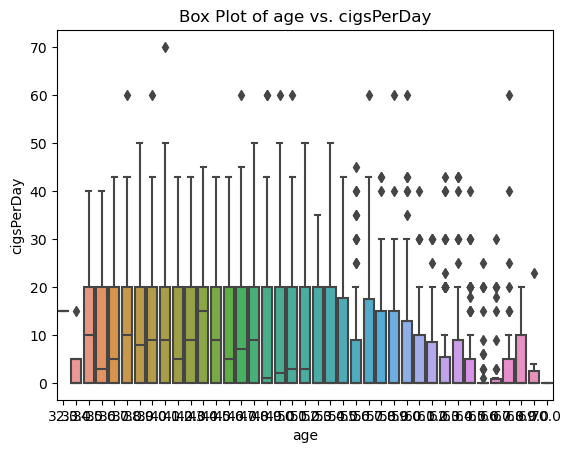

In [62]:
sns.boxplot(x='age', y='cigsPerDay', data=data)
plt.xlabel('age')
plt.ylabel('cigsPerDay')
plt.title('Box Plot of age vs. cigsPerDay')
plt.show()

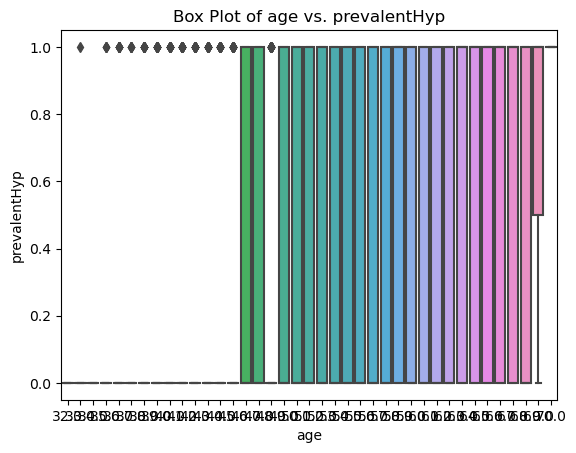

In [63]:
sns.boxplot(x='age', y='prevalentHyp', data=data)
plt.xlabel('age')
plt.ylabel('prevalentHyp')
plt.title('Box Plot of age vs. prevalentHyp')
plt.show()

C:\Users\RDP\AppData\Local\Temp\ipykernel_6020\1512770817.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = data.corr()


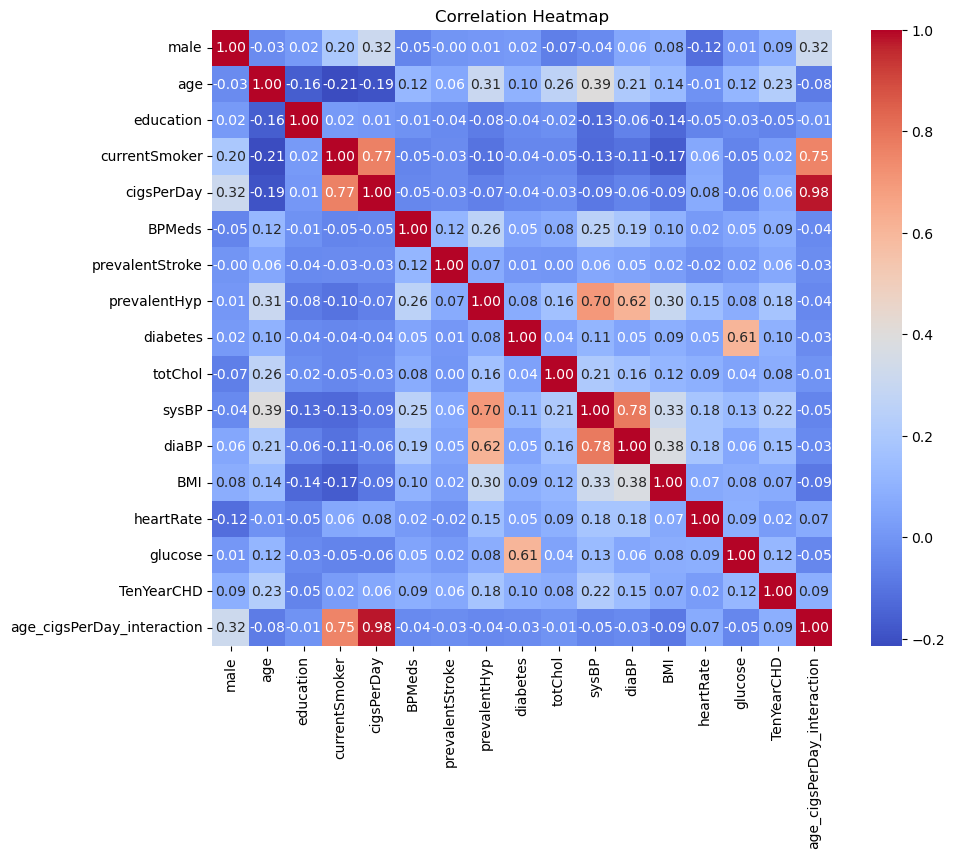

In [64]:
corr_matrix = data.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

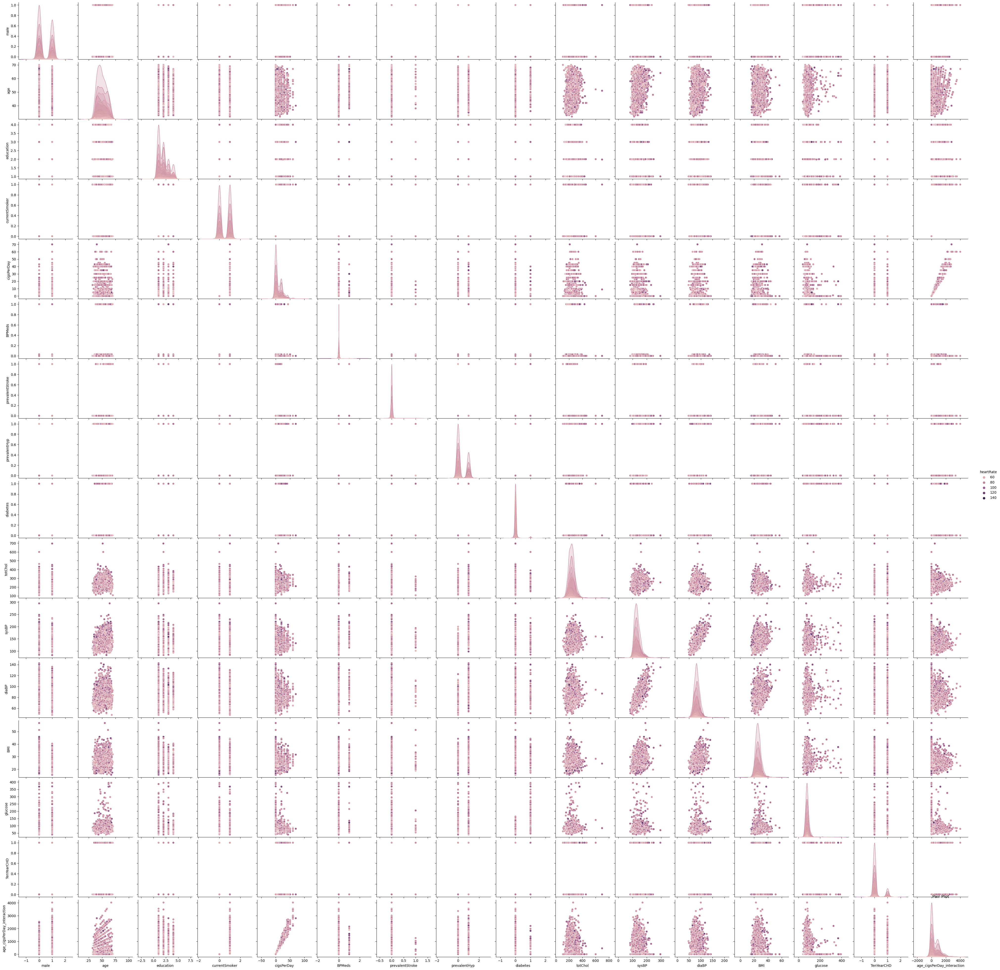

In [65]:
sns.pairplot(data, hue='heartRate')
plt.title('Pair Plot')
plt.show()

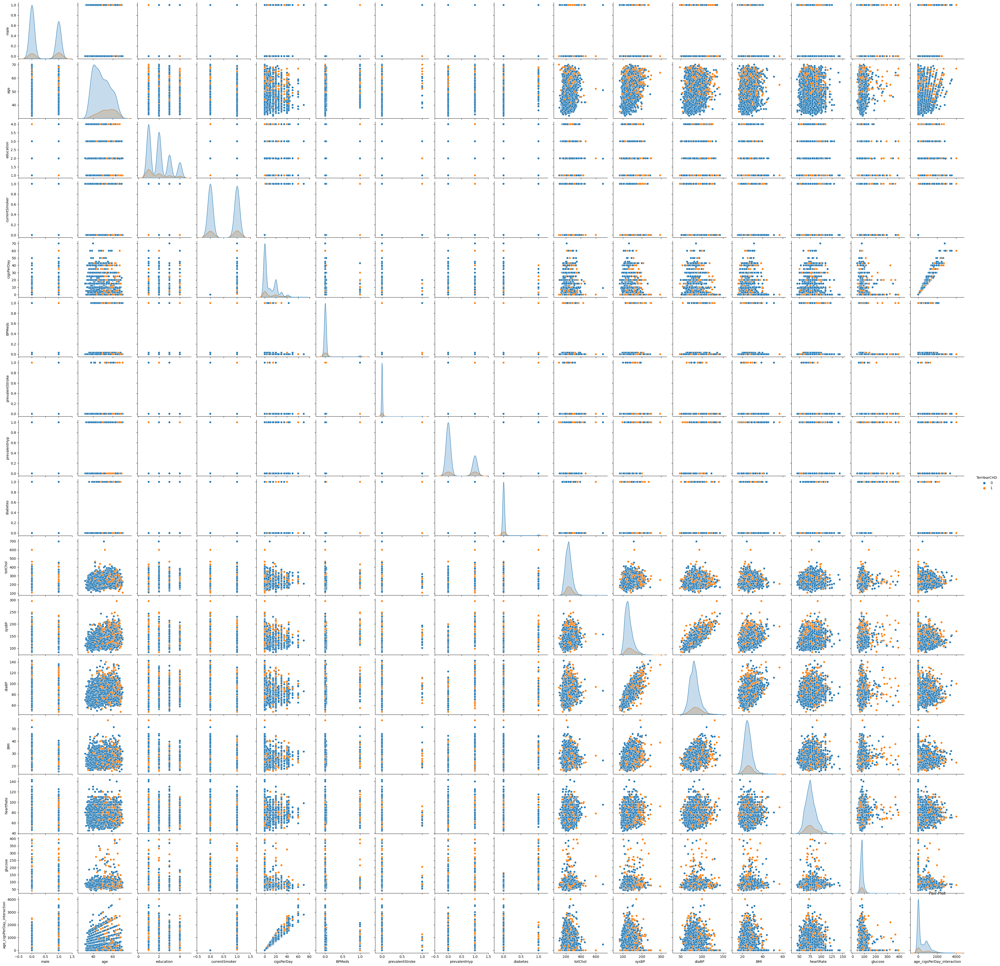

In [66]:
sns.pairplot(data, hue='TenYearCHD')
plt.title('Pair Plot')
plt.show()

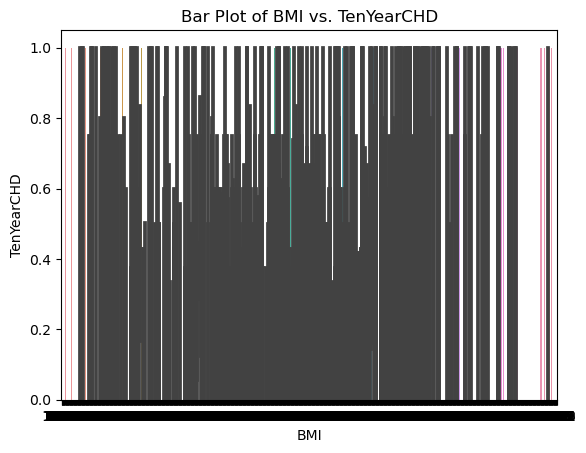

In [67]:
sns.barplot(x='BMI', y='TenYearCHD', data=data)
plt.xlabel('BMI')
plt.ylabel('TenYearCHD')
plt.title('Bar Plot of BMI vs. TenYearCHD')
plt.show()

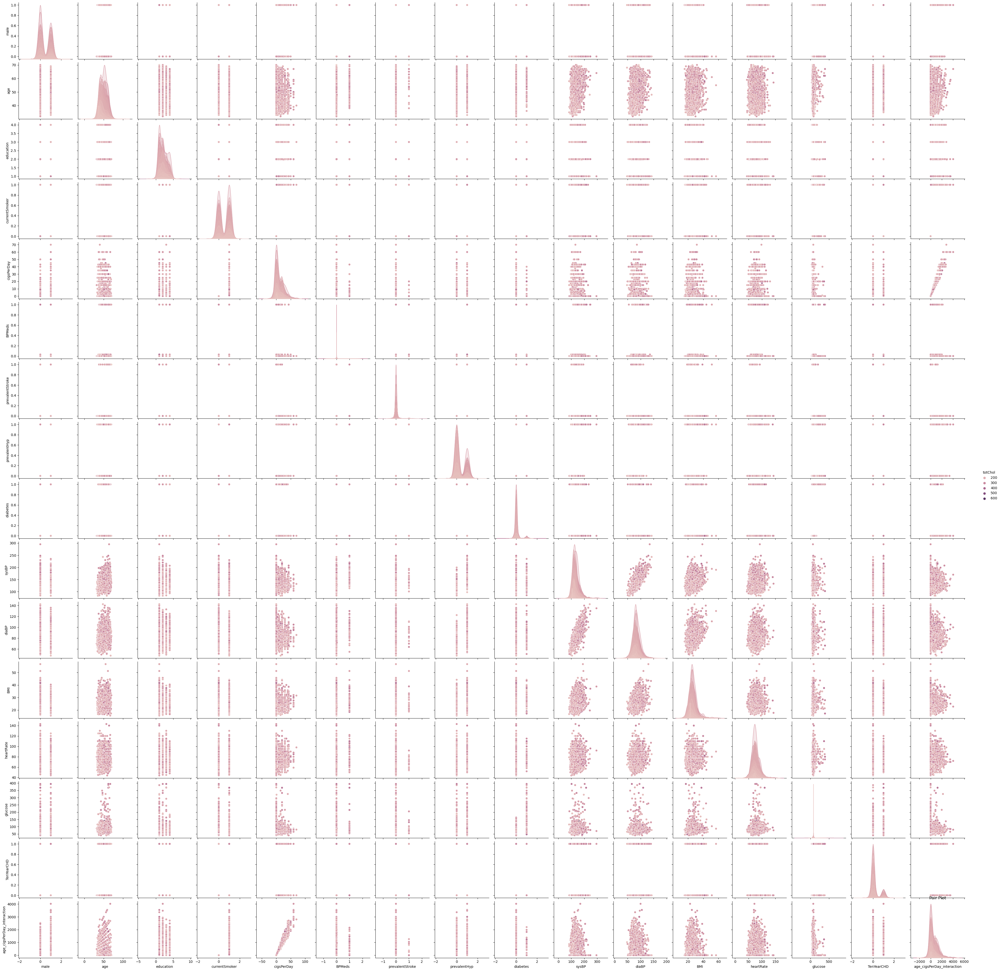

In [72]:
sns.pairplot(data, hue='totChol')
plt.title('Pair Plot')
plt.show()

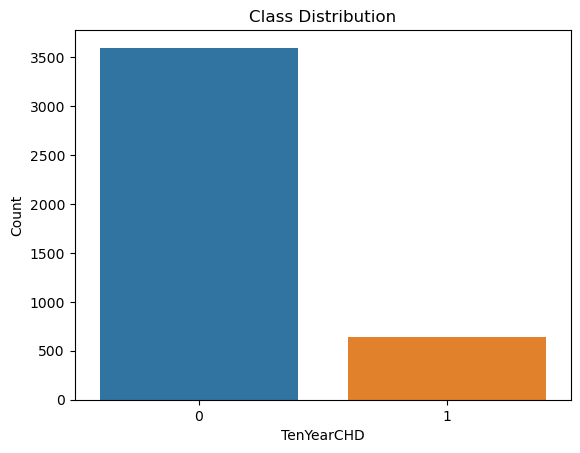

In [69]:
sns.countplot(x='TenYearCHD', data=data)
plt.xlabel('TenYearCHD')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()

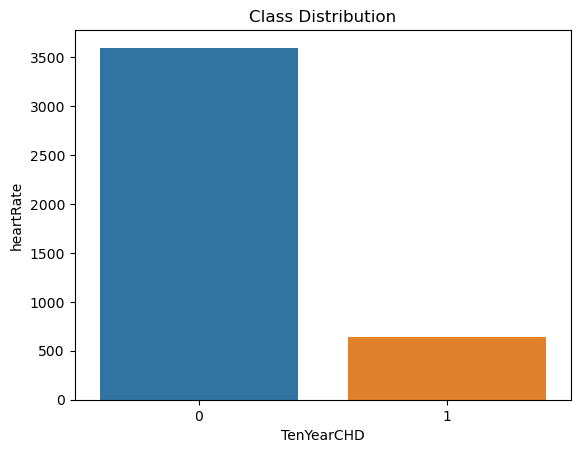

In [70]:
sns.countplot(x='TenYearCHD', data=data)
plt.xlabel('TenYearCHD')
plt.ylabel('heartRate')
plt.title('Class Distribution')
plt.show()

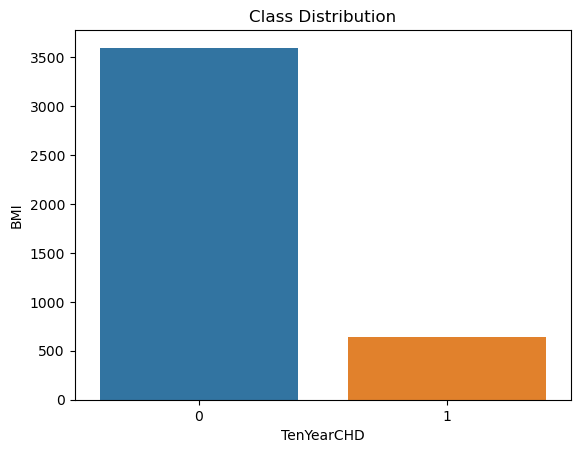

In [71]:
sns.countplot(x='TenYearCHD', data=data)
plt.xlabel('TenYearCHD')
plt.ylabel('BMI')
plt.title('Class Distribution')
plt.show()

In [73]:
data_length = len(data)
print("Length of the dataset:", data_length)

Length of the dataset: 4240


In [74]:
selected_features = data[['TenYearCHD', 'heartRate', 'BMI']]

In [75]:
data[['TenYearCHD', 'heartRate', 'BMI']] = selected_features[['TenYearCHD', 'heartRate', 'BMI']]

In [76]:
print(data[['TenYearCHD', 'heartRate', 'BMI']].mean())
print(data[['TenYearCHD', 'heartRate', 'BMI']].std())

TenYearCHD     0.151887
heartRate     75.878981
BMI           25.800801
dtype: float64
TenYearCHD     0.358953
heartRate     12.023929
BMI            4.070687
dtype: float64


In [77]:
selected_features = data[['TenYearCHD', 'heartRate', 'BMI']]
scaler = StandardScaler()
standardized_features = scaler.fit_transform(selected_features)

In [78]:
num_components = 3
pca = PCA(n_components=num_components)
principal_components = pca.fit_transform(standardized_features)
principal_df = pd.DataFrame(data=principal_components, columns=['TenYearCHD', 'heartRate', 'BMI'])

In [79]:
explained_variance_ratio = pca.explained_variance_ratio_
print('Explained variance ratio:', explained_variance_ratio)

Explained variance ratio: [0.37089012 0.32574969 0.3033602 ]


In [80]:
explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

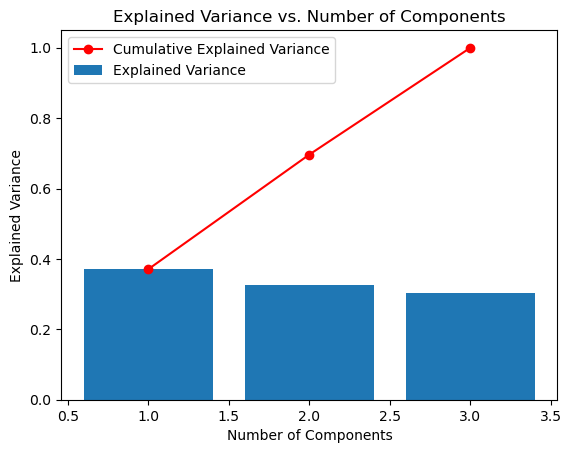

In [81]:
plt.bar(range(1, num_components + 1), explained_variance, label='Explained Variance')
plt.plot(range(1, num_components + 1), cumulative_variance, label='Cumulative Explained Variance', marker='o', color='r')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.legend()
plt.show()

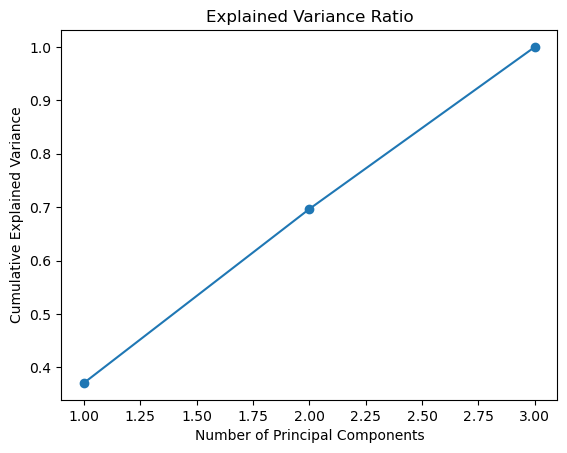

In [82]:
explained_variance_ratio = pca.explained_variance_ratio_
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio.cumsum(), marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance Ratio')
plt.show()

In [83]:
X = data.drop('TenYearCHD', axis=1) 
y = data['TenYearCHD'] 

In [84]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (3392, 19)
y_train shape: (3392,)
X_test shape: (848, 19)
y_test shape: (848,)


In [85]:
print("scikit-learn version:", sklearn.__version__)

scikit-learn version: 1.3.0


In [86]:
imputer = SimpleImputer(strategy='mean') 

In [87]:
data_types = data.dtypes
print(data_types)

male                             int64
age                            float64
education                      float64
currentSmoker                    int64
cigsPerDay                     float64
BPMeds                         float64
prevalentStroke                  int64
prevalentHyp                     int64
diabetes                         int64
totChol                        float64
sysBP                          float64
diaBP                          float64
BMI                            float64
heartRate                      float64
glucose                        float64
TenYearCHD                       int64
age_group                     category
bmi_category                  category
sysBP_category                category
age_cigsPerDay_interaction     float64
dtype: object


In [88]:
print(X.columns)

Index(['male', 'age', 'education', 'currentSmoker', 'cigsPerDay', 'BPMeds',
       'prevalentStroke', 'prevalentHyp', 'diabetes', 'totChol', 'sysBP',
       'diaBP', 'BMI', 'heartRate', 'glucose', 'age_group', 'bmi_category',
       'sysBP_category', 'age_cigsPerDay_interaction'],
      dtype='object')


In [89]:
# import pandas as pd
# from sklearn.preprocessing import OneHotEncoder
# from sklearn.impute import SimpleImputer

# # Assuming you have a DataFrame named 'data' with your dataset

# # Define the categorical features
# categorical_features = ['age_group', 'bmi_category', 'sysBP_category']

# # Extract the numeric columns based on your data_types
# numeric_columns = ['male', 'age', 'education', 'currentSmoker', 'cigsPerDay', 'BPMeds',
#                    'prevalentStroke', 'prevalentHyp', 'diabetes', 'totChol', 'sysBP',
#                    'diaBP', 'BMI', 'heartRate', 'glucose', 'age_cigsPerDay_interaction']

# # Separate the numeric and categorical features
# X_numeric = data[numeric_columns]
# X_categorical = data[categorical_features]

# # Impute missing values for numeric features
# numeric_imputer = SimpleImputer(strategy='mean')
# X_numeric_imputed = pd.DataFrame(numeric_imputer.fit_transform(X_numeric), columns=numeric_columns)

# # Impute missing values for categorical features
# categorical_imputer = SimpleImputer(strategy='most_frequent')
# X_categorical_imputed = pd.DataFrame(categorical_imputer.fit_transform(X_categorical), columns=categorical_features)

# # Concatenate the imputed numeric and categorical features
# X_imputed = pd.concat([X_numeric_imputed, X_categorical_imputed], axis=1)

# # Initialize encoders
# encoders = {}

# # Encode categorical features
# for feature in categorical_features:
#     encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
#     X_encoded = encoder.fit_transform(X_imputed[[feature]])
#     encoders[feature] = encoder

#     # Create a DataFrame for the encoded feature
#     X_encoded_df = pd.DataFrame(X_encoded, columns=encoder.get_feature_names_out([feature]))

#     # Set the column names based on the encoder
#     X_encoded_df.columns = encoder.get_feature_names_out([feature])

#     # Concatenate the encoded feature to your original data
#     X_imputed = pd.concat([X_imputed, X_encoded_df], axis=1)

# # Drop the original categorical columns
# X_imputed.drop(categorical_features, axis=1, inplace=True)

# # ... Rest of your code ...


In [92]:
log_reg_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LogisticRegression())
])

svm_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', SVC())
])

dt_pipeline = Pipeline([
    ('model', DecisionTreeClassifier())
])

knn_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', KNeighborsClassifier())
])

log_reg_pipeline.fit(X_train, y_train)
svm_pipeline.fit(X_train, y_train)
dt_pipeline.fit(X_train, y_train)
knn_pipeline.fit(X_train, y_train)

log_reg_predictions = log_reg_pipeline.predict(X_test)
svm_predictions = svm_pipeline.predict(X_test)
dt_predictions = dt_pipeline.predict(X_test)
knn_predictions = knn_pipeline.predict(X_test)

log_reg_accuracy = accuracy_score(y_test, log_reg_predictions)
svm_accuracy = accuracy_score(y_test, svm_predictions)
dt_accuracy = accuracy_score(y_test, dt_predictions)
knn_accuracy = accuracy_score(y_test, knn_predictions)

log_reg_precision = precision_score(y_test, log_reg_predictions)
svm_precision = precision_score(y_test, svm_predictions)
dt_precision = precision_score(y_test, dt_predictions)
knn_precision = precision_score(y_test, knn_predictions)

log_reg_recall = recall_score(y_test, log_reg_predictions)
svm_recall = recall_score(y_test, svm_predictions)
dt_recall = recall_score(y_test, dt_predictions)
knn_recall = recall_score(y_test, knn_predictions)

log_reg_f1 = f1_score(y_test, log_reg_predictions)
svm_f1 = f1_score(y_test, svm_predictions)
dt_f1 = f1_score(y_test, dt_predictions)
knn_f1 = f1_score(y_test, knn_predictions)

print("Logistic Regression:")
print("Accuracy:", log_reg_accuracy)
print("Precision:", log_reg_precision)
print("Recall:", log_reg_recall)
print("F1 Score:", log_reg_f1)

print("\nSVM:")
print("Accuracy:", svm_accuracy)
print("Precision:", svm_precision)
print("Recall:", svm_recall)
print("F1 Score:", svm_f1)

print("\nDecision Tree:")
print("Accuracy:", dt_accuracy)
print("Precision:", dt_precision)
print("Recall:", dt_recall)
print("F1 Score:", dt_f1)

print("\nKNN:")
print("Accuracy:", knn_accuracy)
print("Precision:", knn_precision)
print("Recall:", knn_recall)
print("F1 Score:", knn_f1)


Logistic Regression:
Accuracy: 0.8561320754716981
Precision: 0.5294117647058824
Recall: 0.07317073170731707
F1 Score: 0.12857142857142856

SVM:
Accuracy: 0.8537735849056604
Precision: 0.3333333333333333
Recall: 0.008130081300813009
F1 Score: 0.015873015873015876

Decision Tree:
Accuracy: 0.7405660377358491
Precision: 0.1510791366906475
Recall: 0.17073170731707318
F1 Score: 0.1603053435114504

KNN:
Accuracy: 0.8313679245283019
Precision: 0.2222222222222222
Recall: 0.06504065040650407
F1 Score: 0.10062893081761007


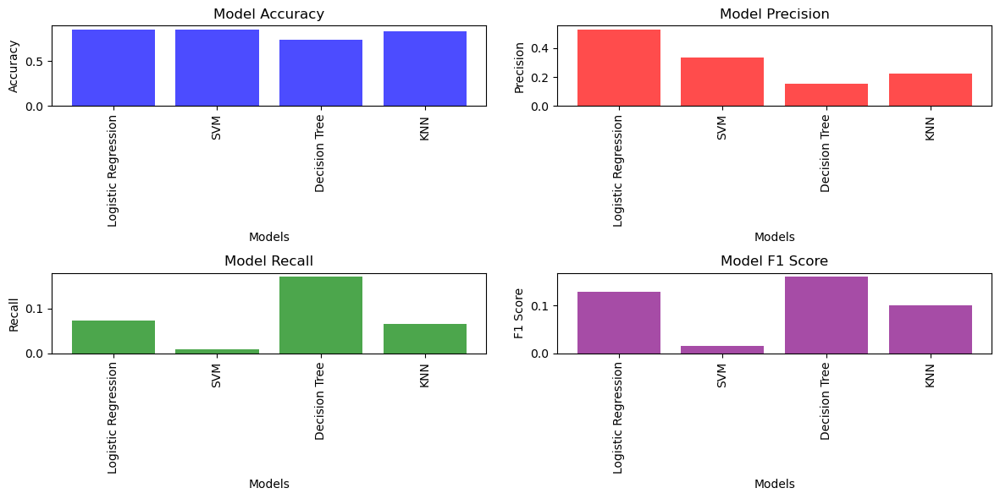

In [93]:
import matplotlib.pyplot as plt

labels = ['Logistic Regression', 'SVM', 'Decision Tree', 'KNN']

accuracy_scores = [log_reg_accuracy, svm_accuracy, dt_accuracy, knn_accuracy]

precision_scores = [log_reg_precision, svm_precision, dt_precision, knn_precision]

recall_scores = [log_reg_recall, svm_recall, dt_recall, knn_recall]

f1_scores = [log_reg_f1, svm_f1, dt_f1, knn_f1]

# Plotting
x = range(len(labels))

plt.figure(figsize=(12, 6))

plt.subplot(2, 2, 1)
plt.bar(x, accuracy_scores, color='b', alpha=0.7)
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Accuracy')
plt.xticks(x, labels, rotation='vertical')

plt.subplot(2, 2, 2)
plt.bar(x, precision_scores, color='r', alpha=0.7)
plt.xlabel('Models')
plt.ylabel('Precision')
plt.title('Model Precision')
plt.xticks(x, labels, rotation='vertical')

plt.subplot(2, 2, 3)
plt.bar(x, recall_scores, color='g', alpha=0.7)
plt.xlabel('Models')
plt.ylabel('Recall')
plt.title('Model Recall')
plt.xticks(x, labels, rotation='vertical')

plt.subplot(2, 2, 4)
plt.bar(x, f1_scores, color='purple', alpha=0.7)
plt.xlabel('Models')
plt.ylabel('F1 Score')
plt.title('Model F1 Score')
plt.xticks(x, labels, rotation='vertical')

plt.tight_layout()
plt.show()


In [94]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

In [95]:
conf_matrices = [confusion_matrix(y_test, log_reg_predictions),
                 confusion_matrix(y_test, svm_predictions),
                 confusion_matrix(y_test, dt_predictions),
                 confusion_matrix(y_test, knn_predictions)]

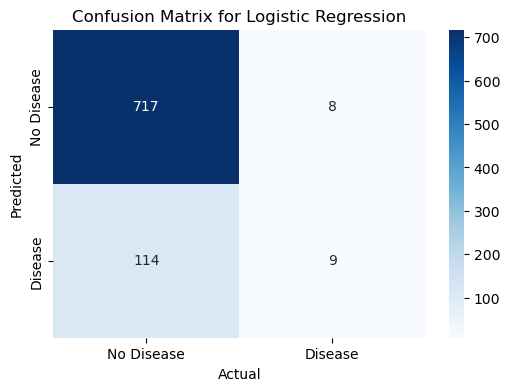

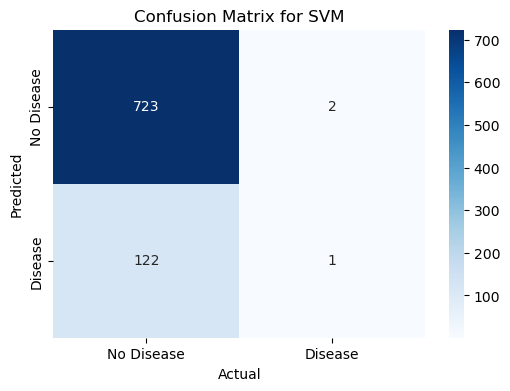

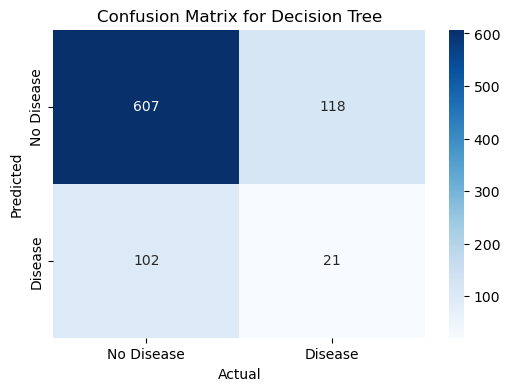

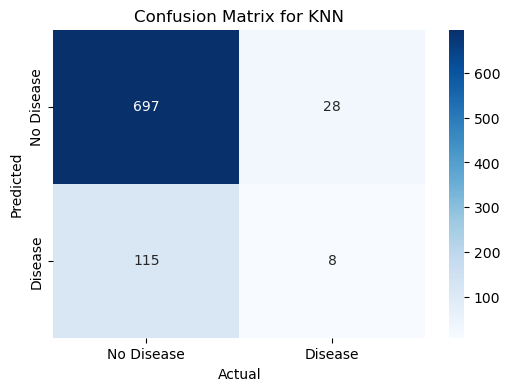

In [96]:
# Plot confusion matrices
for i in range(len(labels)):
    plt.figure(figsize=(6, 4))
    sns.heatmap(conf_matrices[i], annot=True, fmt='d', cmap='Blues',
                xticklabels=['No Disease', 'Disease'],
                yticklabels=['No Disease', 'Disease'])
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'Confusion Matrix for {labels[i]}')
    plt.show()

In [97]:
from sklearn.metrics import roc_curve, auc

In [98]:
# ROC curve
fpr, tpr, roc_auc = [], [], []

for predictions in [log_reg_predictions, svm_predictions, dt_predictions, knn_predictions]:
    f, t, _ = roc_curve(y_test, predictions)
    fpr.append(f)
    tpr.append(t)
    roc_auc.append(auc(f, t))


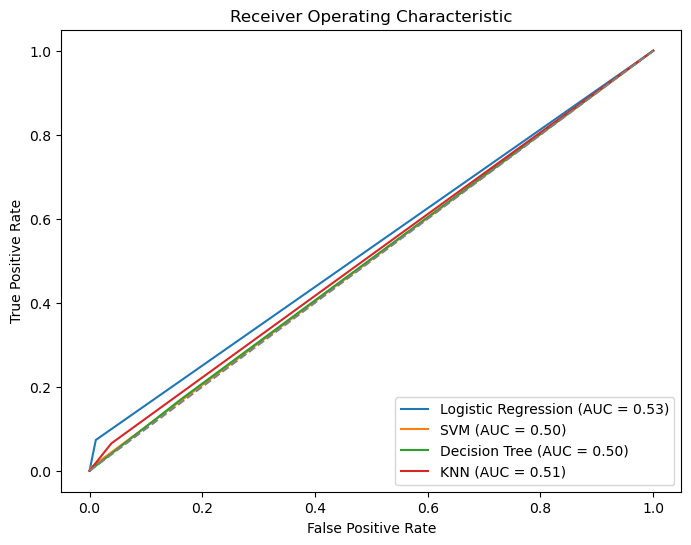

In [99]:
# Plot ROC curves
plt.figure(figsize=(8, 6))
for i in range(len(labels)):
    plt.plot(fpr[i], tpr[i], label=f'{labels[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

In [100]:
from sklearn.metrics import precision_recall_curve

In [101]:
# precision-recall
precisions, recalls, thresholds = [], [], []

for predictions in [log_reg_predictions, svm_predictions, dt_predictions, knn_predictions]:
    p, r, t = precision_recall_curve(y_test, predictions)
    precisions.append(p)
    recalls.append(r)
    thresholds.append(t)

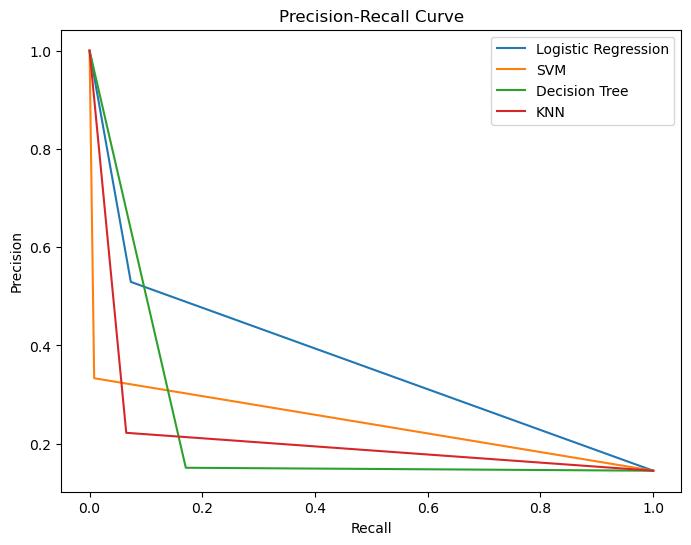

In [102]:
# Plot precision-recall
plt.figure(figsize=(8, 6))
for i in range(len(labels)):
    plt.plot(recalls[i], precisions[i], label=f'{labels[i]}')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='upper right')
plt.show()

In [103]:
evaluation_metrics = {
    'Logistic Regression': [log_reg_accuracy, log_reg_precision, log_reg_recall, log_reg_f1],
    'SVM': [svm_accuracy, svm_precision, svm_recall, svm_f1],
    'Decision Tree': [dt_accuracy, dt_precision, dt_recall, dt_f1],
    'KNN': [knn_accuracy, knn_precision, knn_recall, knn_f1]
}
print("Evaluation Metrics:")
print("Model\t\t\tAccuracy\tPrecision\tRecall\t\tF1 Score")
print("-" * 70)
for model, metrics in evaluation_metrics.items():
    print(f"{model.ljust(20)}\t{metrics[0]:.4f}\t\t{metrics[1]:.4f}\t\t{metrics[2]:.4f}\t\t{metrics[3]:.4f}")

# most suitable model based on accuracy
best_model = max(evaluation_metrics, key=lambda k: evaluation_metrics[k][0])
print("\nThe most suitable model based on accuracy is:", best_model)

Evaluation Metrics:
Model			Accuracy	Precision	Recall		F1 Score
----------------------------------------------------------------------
Logistic Regression 	0.8561		0.5294		0.0732		0.1286
SVM                 	0.8538		0.3333		0.0081		0.0159
Decision Tree       	0.7406		0.1511		0.1707		0.1603
KNN                 	0.8314		0.2222		0.0650		0.1006

The most suitable model based on accuracy is: Logistic Regression


In [105]:
metrics = {
    'Logistic Regression': {'accuracy': 0.8561, 'f1_score': 0.1286, 'precision': 0.5294, 'recall': 0.0732},
    'SVM': {'accuracy': 0.8538, 'f1_score': 0.0159, 'precision': 0.3333, 'recall': 0.0081},
    'Decision Tree': {'accuracy': 0.7406, 'f1_score': 0.1603, 'precision': 0.1511, 'recall': 0.1707},
    'KNN': {'accuracy': 0.8314, 'f1_score': 0.1006, 'precision': 0.2222, 'recall': 0.0650}
}

# scoring function
def calculate_score(metric_values):
    return 0.5 * (metric_values['accuracy'] + metric_values['f1_score']) + 0.25 * (metric_values['precision'] + metric_values['recall'])

scores = {model: calculate_score(values) for model, values in metrics.items()}

most_suitable_model = max(scores, key=scores.get)

print(f"The most suitable model is: {most_suitable_model} with a score of {scores[most_suitable_model]}")

The most suitable model is: Logistic Regression with a score of 0.643
